In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile
from IPython.display import Audio
%matplotlib inline
import os

from sklearn.decomposition import FastICA

from mcc import mean_corr_coef as mcc

In [2]:
# Load mixed audios
f, x1 = scipy.io.wavfile.read('new_audios/simultaneous/guitar.wav')

f, x2 = scipy.io.wavfile.read('new_audios/simultaneous/kalimba.wav')

f, x3 = scipy.io.wavfile.read('new_audios/simultaneous/whistle.wav')

In [3]:
x1 = (x1 - x1.min()) / (x1.max() - x1.min())
x2 = (x2 - x2.min()) / (x2.max() - x2.min())
x3 = (x3 - x3.min()) / (x3.max() - x3.min())

/Users/barimpac/miniconda3/envs/research/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: overflow encountered in short_scalars
  """Entry point for launching an IPython kernel.
/Users/barimpac/miniconda3/envs/research/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in short_scalars
  
/Users/barimpac/miniconda3/envs/research/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in short_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


In [4]:
# x1 = x1 - x1.mean()
# x2 = x2 - x2.mean()
# x2 = x3 - x3.mean()

In [5]:
# # Standardize data
# x1 = x1/x1.std()
# x2 = x2/x2.std()
# x3 = x3/x3.std()

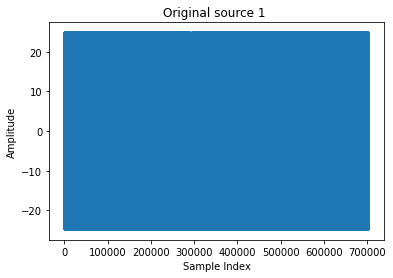

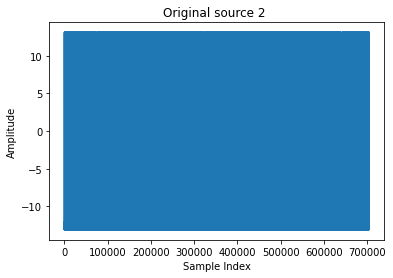

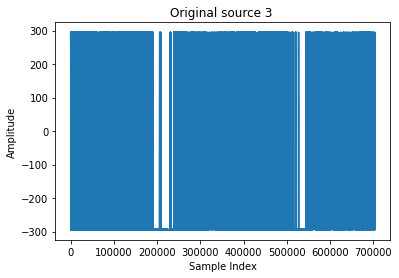

In [6]:
mixed = [x1, x2, x3]

# Visualize and play mixed sources
for i in range(len(mixed)):

    s = mixed[i]

    # plot waveform
    plt.figure()
    plt.plot(s)
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.title('Original source %d ' % (i+1))
    plt.show()

    # Play audio
    aud = Audio(s, rate=f)
    display(aud)

In [7]:
# Get estimated sources using ICA
X = np.array([x1, x2, x3])

In [8]:
X = X.T

In [9]:
X.shape

(704146, 3)

In [10]:
# transformer = FastICA(n_components=3, random_state=3, whiten=True)
transformer = FastICA(n_components=3, random_state=3, whiten=False)

In [11]:
S_est = transformer.fit_transform(X)

/Users/barimpac/miniconda3/envs/research/lib/python3.7/site-packages/sklearn/decomposition/_fastica.py:462: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn('Ignoring n_components with whiten=False.')


In [12]:
S_est.shape

(704146, 3)

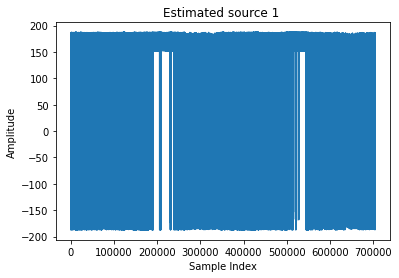

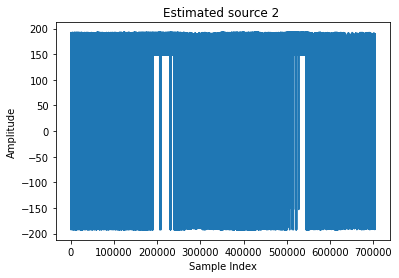

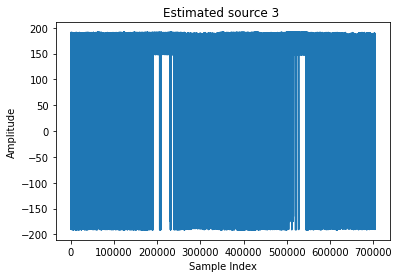

In [13]:
# Visualize and play estimated sources
for i in range(S_est.shape[1]):

    s = S_est[:,i]

    # plot waveform
    plt.figure()
    plt.plot(s)
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.title('Estimated source %d ' % (i+1))
    plt.show()

    # Play audio
    aud = Audio(s, rate=f)
    display(aud)

In [14]:
# # Estimate ICA performance by calculating mean correlation coefficient

# f, s1 = scipy.io.wavfile.read('new_audios/simultaneous/guitar.wav')

# f, s2 = scipy.io.wavfile.read('new_audios/simultaneous/kalimba.wav')

# f, s3 = scipy.io.wavfile.read('new_audios/simultaneous/whistle.wav')

# S = np.array([s1, s2, s3])

# S = S.T

# mcc(S_est, S)